#### Image Captioning - ResNet101 + LSTM


In [ ]:
# !sudo -S apt-get install blah < /pathto/mypasswordfile # again -S is important here

# terminal에서 실행
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

In [24]:
import tensorflow as tf

import matplotlib.pyplot as plt

import collections
import random
import numpy as np
import pandas as pd
import os
import time
import json
from PIL import Image

from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.bleu_score import SmoothingFunction

plt.rc('font', family = 'NanumBarunGothic')

## MS-COCO 데이터셋 다운로드 및 준비

[MS-COCO 2014 데이터셋](http://cocodataset.org/#home)을 다운로드합니다. 그리고 다운로드받은 파일의 압축을 해제하고 각각 train2014, val2014 폴더로 저장합니다. 이 코드에서 caption file을 다운로드받기는 하지만, 이 파일은 영어로 이루어진 caption 파일로 이 코드 내에서는 활용되지 않습니다.

만일 Colab에서 다음을 실행시킬 경우, 파일에 'captions_kor_train.json' 파일과 'captions_kor_val.json' 파일을 업로드해줍니다. 만일 로컬 PC에서 동작시키실 경우, 후에 두 annotation file의 경로를 지정해주면 됩니다.

In [5]:
# Download caption annotation files
# annotation_folder = '/annotations/'
# if not os.path.exists(os.path.abspath('.') + annotation_folder):
#   annotation_zip = tf.keras.utils.get_file('captions.zip',
#                                            cache_subdir=os.path.abspath('.'),
#                                            origin='http://images.cocodataset.org/annotations/annotations_trainval2014.zip',
#                                            extract=True)
#   annotation_file = os.path.dirname(annotation_zip)+'/annotations/captions_train2014.json'
#   os.remove(annotation_zip)

# Download image files
image_folder = '/train2014/'
if not os.path.exists(os.path.abspath('.') + image_folder):
  image_zip = tf.keras.utils.get_file('train2014.zip',
                                      cache_subdir=os.path.abspath('.'),
                                      origin='http://images.cocodataset.org/zips/train2014.zip',
                                      extract=True)
  PATH = os.path.dirname(image_zip) + image_folder
  os.remove(image_zip)
else:
  PATH = os.path.abspath('.') + image_folder

13510573713/13510573713 [==============================] - 1329s 0us/step


In [29]:
image_folder ='train2014/'
PATH = image_folder

만일 Local PC에서 이 프로그램을 동작시킬 경우, annotation_file에 'captions_kor_train.json' 파일의 경로를 입력해주어 연결시켜줍니다.

In [9]:
# annotation_file = 'annotations/captions_train2014.json'
# with open(annotation_file, 'r') as f:
#     annotations = json.load(f)

# image_folder ='train2014/'
# PATH = image_folder

In [26]:
# # Group all captions together having the same image ID.
# image_path_to_caption = collections.defaultdict(list)
# for val in annotations['annotations']:
#   caption = f"<start> {val['caption']} <end>"
#   image_path = PATH + 'COCO_train2014_' + '%012d.jpg' % (val['image_id'])
#   image_path_to_caption[image_path].append(caption)

['<start> A very clean and well decorated empty bathroom <end>', '<start> A blue and white bathroom with butterfly themed wall tiles. <end>', '<start> A bathroom with a border of butterflies and blue paint on the walls above it. <end>', '<start> An angled view of a beautifully decorated bathroom. <end>', '<start> A clock that blends in with the wall hangs in a bathroom.  <end>']


### train annotations json 사용하는 경우


In [30]:
annotation_file = 'annotations/train_annotations.json'
with open(annotation_file, 'r') as f:
    annotations = json.load(f)

image_folder ='train2014/'
PATH = image_folder

In [31]:
# Group all captions together having the same image ID.
image_path_to_caption = collections.defaultdict(list)
for img in annotations:
  for caption_ko in img['caption_ko']:
    caption = f"<start> {caption_ko} <end>"
    image_path = PATH + img['file_path'].split('/')[-1]
    print(image_path)
    image_path_to_caption[image_path].append(caption)

print(image_path_to_caption['train2014/COCO_train2014_000000318556.jpg'])

train2014/COCO_train2014_000000057870.jpg
train2014/COCO_train2014_000000057870.jpg
train2014/COCO_train2014_000000057870.jpg
train2014/COCO_train2014_000000057870.jpg
train2014/COCO_train2014_000000057870.jpg
train2014/COCO_train2014_000000384029.jpg
train2014/COCO_train2014_000000384029.jpg
train2014/COCO_train2014_000000384029.jpg
train2014/COCO_train2014_000000384029.jpg
train2014/COCO_train2014_000000384029.jpg
train2014/COCO_train2014_000000222016.jpg
train2014/COCO_train2014_000000222016.jpg
train2014/COCO_train2014_000000222016.jpg
train2014/COCO_train2014_000000222016.jpg
train2014/COCO_train2014_000000222016.jpg
train2014/COCO_train2014_000000520950.jpg
train2014/COCO_train2014_000000520950.jpg
train2014/COCO_train2014_000000520950.jpg
train2014/COCO_train2014_000000520950.jpg
train2014/COCO_train2014_000000520950.jpg
train2014/COCO_train2014_000000069675.jpg
train2014/COCO_train2014_000000069675.jpg
train2014/COCO_train2014_000000069675.jpg
train2014/COCO_train2014_000000069

In [32]:
image_paths = list(image_path_to_caption.keys())
random.shuffle(image_paths)

# 용량 제한을 두어 30,000개의 캡션(6,000개의 이미지)만 사용할 수도 있습니다.
train_image_paths = image_paths#[:6000]
print(len(train_image_paths))

82783


In [33]:
train_captions = []
img_name_vector = []

for image_path in train_image_paths:
  caption_list = image_path_to_caption[image_path]
  train_captions.extend(caption_list)
  img_name_vector.extend([image_path] * len(caption_list))

## ResNet101 사용하여 이미지 전처리하기

다음으로, (Imagenet에 대해 사전 훈련된) ResNet101을 사용하여 이미지를 분류하고 마지막 Convolutional Layer에서 특징을 추출해냅니다.

- 이미지를 299px x 299px로 resize합니다.
- [ResNet101 설명](https://www.tensorflow.org/api_docs/python/tf/keras/applications/resnet/ResNet101)

In [55]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.resnet.preprocess_input(img)
    return img, image_path

## ResNet101 초기화 및 사전 훈련된 Imagenet 가중치 로드하기

이제 Output Layer가 InceptionV3의 마지막 Convolutional Layer인 tf.keras 모델을 만듭니다.

- 네트워크를 통해 각 이미지를 전달하고 결과 벡터를 사전 (image_name --&gt; feature_vector)에 저장합니다.
- 모든 이미지가 네트워크를 통해 전달된 후, 사전을 디스크에 저장합니다.

In [56]:
image_model = tf.keras.applications.ResNet101(include_top=False,
                                                weights='imagenet')

new_input = image_model.input
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

## ResNet101에서 추출된 특성 캐시하기

ResNet101로 각 이미지를 사전 처리하고 출력을 디스크에 캐시합니다. 현재 코드보다 정교한 캐싱 전략(ex. 임의 액세스 디스크 I/O를 줄이기 위해 이미지 분할 등)으로 성능을 향상할 수 있습니다.


In [33]:
# Get unique images
encode_train = sorted(set(img_name_vector))

# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.AUTOTUNE).batch(16)

for img, path in image_dataset:
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())

## 캡션 전처리 및 토큰화하기

- 캡션을 토큰화합니다. 그리고 최대 단어의 크기를 상위 10,000개 단어로 제한합니다. 
그 단어 이외의 단어들은 토큰 "UNK"(알 수 없음)로 대체됩니다.
- 그 후, 단어 대 인덱스 및 인덱스 대 단어 매핑을 만듭니다.
- 마지막으로, 모든 시퀀스를 가장 긴 시퀀스와 같은 길이로 채웁니다.

In [35]:
# Find the maximum length of any caption in the dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

In [36]:
# Choose the top 10,000 words from the vocabulary
top_k = 10000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                  oov_token="<unk>",
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~')
tokenizer.fit_on_texts(train_captions)

In [37]:
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

In [38]:
# Create the tokenized vectors
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [39]:
# Pad each vector to the max_length of the captions
# If you do not provide a max_length value, pad_sequences calculates it automatically
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [40]:
# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)

## 데이터를 훈련(Train) 및 평가(Validation) 데이터셋로 분할하기




In [43]:
img_to_cap_vector = collections.defaultdict(list)
for img, cap in zip(img_name_vector, cap_vector):
  img_to_cap_vector[img].append(cap)

# Create training and validation sets using an 80:20 split randomly.
img_keys = list(img_to_cap_vector.keys())
random.shuffle(img_keys)

slice_index = int(len(img_keys)*0.8)
img_name_train_keys, img_name_val_keys = img_keys[:slice_index], img_keys[slice_index:]

img_name_train = []
cap_train = []
for imgt in img_name_train_keys:
  capt_len = len(img_to_cap_vector[imgt])
  img_name_train.extend([imgt] * capt_len)
  cap_train.extend(img_to_cap_vector[imgt])

img_name_val = []
cap_val = []
for imgv in img_name_val_keys:
  capv_len = len(img_to_cap_vector[imgv])
  img_name_val.extend([imgv] * capv_len)
  cap_val.extend(img_to_cap_vector[imgv])

## 훈련을 위한 tf.data 데이터세트 생성하기


이미지와 캡션이 준비되었습니다. 다음으로 모델 훈련에 사용할 `tf.data` 데이터세트를 만듭니다.

In [44]:
# Feel free to change these parameters according to your system's configuration
BATCH_SIZE = 64
BUFFER_SIZE = 1000
embedding_dim = 256
units = 512
vocab_size = top_k + 1
num_steps = len(img_name_train) // BATCH_SIZE
# Shape of the vector extracted from ResNet101 is (100, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 100

In [43]:
# Load the numpy files
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

In [44]:
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

## 모델

모델은 Encoder로 CNN을 Decoder로 RNN을 활용합니다. 
- CNN에서는 이미지의 Feature들을 추출해낸 후, 
- 추출한 Feature들을 RNN을 통해서 단어 토큰으로 출력하는 구조로 이루어집니다. 

In [47]:
class BahdanauAttention(tf.keras.Model):
  def __init__(self, units):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    # features(CNN_encoder output) shape == (batch_size, 100, embedding_dim)

    # hidden shape == (batch_size, hidden_size)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
    hidden_with_time_axis = tf.expand_dims(hidden, 1)

    # attention_hidden_layer shape == (batch_size, 100, units)
    attention_hidden_layer = (tf.nn.tanh(self.W1(features) +
                                         self.W2(hidden_with_time_axis)))

    # score shape == (batch_size, 100, 1)
    # This gives you an unnormalized score for each image feature.
    score = self.V(attention_hidden_layer)

    # attention_weights shape == (batch_size, 100, 1)
    attention_weights = tf.nn.softmax(score, axis=1)

    # context_vector shape after sum == (batch_size, hidden_size)
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)

    return context_vector, attention_weights

In [48]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 100, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [49]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)

    self.attention = BahdanauAttention(self.units)

  def call(self, x, features, hidden):
    # defining attention as a separate model
    context_vector, attention_weights = self.attention(features, hidden)

    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)

    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # output shape == (batch_size * max_length, vocab)
    x = self.fc2(x)

    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [51]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)

In [68]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

## 체크포인트

In [69]:
checkpoint_path = "./checkpoints/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer=optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [70]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  # restoring the latest checkpoint in checkpoint_path
  ckpt.restore(ckpt_manager.latest_checkpoint)

## 훈련하기

- 각 `.npy` 파일에 저장된 특성을 추출한 다음, 해당 특성을 endcoder를 통해 전달합니다.
- encoder의 출력값, decoder의 hidden state(0으로 초기화됨) 및 입력값(start token)이 decoder로 전달됩니다.
- decoder는 예측값 및 decoder hidden state를 반환합니다.
- 그 후 decoder hidden state가 모델로 다시 전달되고, 예측값은 손실을 계산하는 데 사용됩니다. 
- teacher forcing를 사용하여 decoder에 대한 다음 입력을 결정합니다. teacher forcing은 출력값이, 다음 입력값으로 decoder에 전달되는 기법입니다.
- 마지막으로 Gradient를 계산하고 이를 Optimizer에 적용하여 Back-propagation합니다.


In [53]:
# adding this in a separate cell because if you run the training cell
# many times, the loss_plot array will be reset
loss_plot = []

In [54]:
@tf.function
def train_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss

- Epoch는 다음 학습을 몇 번 반복할 지를 결정합니다. 
- Default 값으로는 20번으로 지정되어있습니다.
- 이용자가 원하는 만큼 지정해서 성능을 향상시킵니다.

In [55]:
EPOCHS = 20

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
      ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

Epoch 1 Batch 0 Loss 2.0383
Epoch 1 Batch 100 Loss 1.3543
Epoch 1 Batch 200 Loss 1.1471
Epoch 1 Batch 300 Loss 1.0403
Epoch 1 Batch 400 Loss 1.0673
Epoch 1 Batch 500 Loss 0.9646
Epoch 1 Batch 600 Loss 0.9059
Epoch 1 Batch 700 Loss 0.9289
Epoch 1 Batch 800 Loss 0.8774
Epoch 1 Batch 900 Loss 0.8392
Epoch 1 Batch 1000 Loss 0.8525
Epoch 1 Batch 1100 Loss 0.8987
Epoch 1 Batch 1200 Loss 0.9092
Epoch 1 Batch 1300 Loss 0.9074
Epoch 1 Batch 1400 Loss 0.8196
Epoch 1 Batch 1500 Loss 0.8320
Epoch 1 Batch 1600 Loss 0.8304
Epoch 1 Batch 1700 Loss 0.7986
Epoch 1 Batch 1800 Loss 0.8598
Epoch 1 Batch 1900 Loss 0.7770
Epoch 1 Batch 2000 Loss 0.8912
Epoch 1 Batch 2100 Loss 0.8379
Epoch 1 Batch 2200 Loss 0.9053
Epoch 1 Batch 2300 Loss 0.8476
Epoch 1 Batch 2400 Loss 0.7422
Epoch 1 Batch 2500 Loss 0.8735
Epoch 1 Batch 2600 Loss 0.7719
Epoch 1 Batch 2700 Loss 0.6919
Epoch 1 Batch 2800 Loss 0.8335
Epoch 1 Batch 2900 Loss 0.8250
Epoch 1 Batch 3000 Loss 0.7708
Epoch 1 Batch 3100 Loss 0.8605
Epoch 1 Batch 3200 L

In [56]:
print(loss_plot)

[<tf.Tensor: shape=(), dtype=float32, numpy=0.8442067>, <tf.Tensor: shape=(), dtype=float32, numpy=0.71947855>, <tf.Tensor: shape=(), dtype=float32, numpy=0.68090695>, <tf.Tensor: shape=(), dtype=float32, numpy=0.6522854>, <tf.Tensor: shape=(), dtype=float32, numpy=0.6278449>, <tf.Tensor: shape=(), dtype=float32, numpy=0.60599154>, <tf.Tensor: shape=(), dtype=float32, numpy=0.5860224>, <tf.Tensor: shape=(), dtype=float32, numpy=0.5677264>, <tf.Tensor: shape=(), dtype=float32, numpy=0.5511122>, <tf.Tensor: shape=(), dtype=float32, numpy=0.5363373>, <tf.Tensor: shape=(), dtype=float32, numpy=0.52308226>, <tf.Tensor: shape=(), dtype=float32, numpy=0.5109691>, <tf.Tensor: shape=(), dtype=float32, numpy=0.5004417>, <tf.Tensor: shape=(), dtype=float32, numpy=0.4904685>, <tf.Tensor: shape=(), dtype=float32, numpy=0.48189464>, <tf.Tensor: shape=(), dtype=float32, numpy=0.4741301>, <tf.Tensor: shape=(), dtype=float32, numpy=0.46724758>, <tf.Tensor: shape=(), dtype=float32, numpy=0.46131018>, <t

In [57]:
val_dataset = tf.data.Dataset.from_tensor_slices((img_name_val, cap_val))

# Use map to load the numpy files in parallel
val_dataset = val_dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.AUTOTUNE)

# Shuffle and batch
val_dataset = val_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
val_dataset = val_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

In [58]:
### val epoch
val_loss_plot = []
start_epoch = 0
EPOCHS = 20

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(val_dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    val_loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
      ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

Epoch 1 Batch 0 Loss 1.0249
Epoch 1 Batch 100 Loss 0.6862
Epoch 1 Batch 200 Loss 0.7318
Epoch 1 Batch 300 Loss 0.7391
Epoch 1 Batch 400 Loss 0.7407
Epoch 1 Batch 500 Loss 0.8238
Epoch 1 Batch 600 Loss 0.8286
Epoch 1 Batch 700 Loss 0.8120
Epoch 1 Batch 800 Loss 0.7654
Epoch 1 Batch 900 Loss 0.7042
Epoch 1 Batch 1000 Loss 0.7107
Epoch 1 Batch 1100 Loss 0.8015
Epoch 1 Batch 1200 Loss 0.7052
Epoch 1 Loss 0.192896
Time taken for 1 epoch 1079.58 sec

Epoch 2 Batch 0 Loss 0.6848
Epoch 2 Batch 100 Loss 0.6251
Epoch 2 Batch 200 Loss 0.6588
Epoch 2 Batch 300 Loss 0.6842
Epoch 2 Batch 400 Loss 0.6838
Epoch 2 Batch 500 Loss 0.6719
Epoch 2 Batch 600 Loss 0.6114
Epoch 2 Batch 700 Loss 0.5981
Epoch 2 Batch 800 Loss 0.6711
Epoch 2 Batch 900 Loss 0.6279
Epoch 2 Batch 1000 Loss 0.6323
Epoch 2 Batch 1100 Loss 0.6935
Epoch 2 Batch 1200 Loss 0.6657
Epoch 2 Loss 0.165402
Time taken for 1 epoch 1051.29 sec

Epoch 3 Batch 0 Loss 0.6450
Epoch 3 Batch 100 Loss 0.6115
Epoch 3 Batch 200 Loss 0.5733
Epoch 3 Batch 

In [ ]:
print(val_loss_plot)

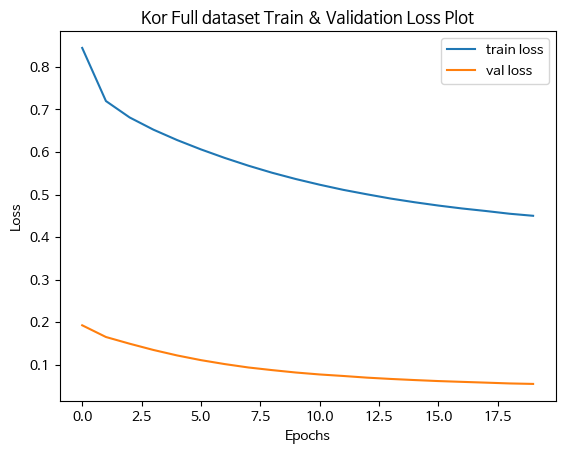

In [60]:
# Train & Validation Loss Plot
plt.plot(loss_plot, label = 'train loss')
plt.plot(val_loss_plot, label = 'val loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Kor Full dataset Train & Validation Loss Plot')
plt.legend()
plt.show()

## 캡셔닝

- 각 타임스텝에서 decoder는 Decoder의 hidden state, encoder 출력값 그리고 이전 예측값을 입력값으로 받습니다.
- 모델이 end 토큰을 예측하면 예측이 중지됩니다.
- 그리고 타임스텝마다 attention 가중치를 저장합니다.

In [71]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

In [73]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for i in range(len_result):
        temp_att = np.resize(attention_plot[i], (8, 8))
        
        #grid_size = max(np.ceil(len_result/2), 2)
        grid_size = max(np.ceil(len_result/4), 4)
        ax = fig.add_subplot(grid_size, grid_size, i+1)
        ax.set_title(result[i])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.5, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

# TEST 단계


Test를 수행하기 위한 MS-COCO 2014 Validation set을 다운로드합니다.

In [63]:
# Download image files
image_folder = '/val2014/'
if not os.path.exists(os.path.abspath('.') + image_folder):
  image_zip = tf.keras.utils.get_file('val2014.zip',
                                      cache_subdir=os.path.abspath('.'),
                                      origin='http://images.cocodataset.org/zips/val2014.zip',
                                      extract=True)
  PATH = os.path.dirname(image_zip) + image_folder
  os.remove(image_zip)
else:
  PATH = os.path.abspath('.') + image_folder

6645013297/6645013297 [==============================] - 616s 0us/step


 그리고 annotation_file 에 이전에 train caption file의 경로를 지정했듯, val caption file의 경로를 지정합니다

In [74]:
annotation_file = '/mnt/hdd/Korean_Based_Image_Captioning_Model/annotations/valid_annotations.json' #s.path.dirname(annotation_zip)+'/annotations/captions_train2014.json'
with open(annotation_file, 'r') as f:
    annotations = json.load(f)

kor_json = annotations

kor_val_caption = []
# for i in range(len(kor_json['annotations'])):
#     for j in range(len(kor_json['annotations'][i])):
#       caption = {'caption': kor_json['annotations'][i]['caption'],
#                  'id': str(kor_json['annotations'][i]['id']).zfill(12), #'{0:12d}'.format(kor_json[i]['id']),
#                  #'id' : kor_json[i]['id'],
#                  'image_id' : kor_json['annotations'][i]['id']}
#       kor_val_caption.append(caption)

for i in range(len(kor_json)):
    for j in range(len(kor_json[i]['caption_ko'])):
      caption = {'caption': kor_json[i]['caption_ko'][j],
                  'id': str(kor_json[i]['id']).zfill(12), #'{0:12d}'.format(kor_json[i]['id']),
                  #'id' : kor_json[i]['id'],
                  'image_id' : kor_json[i]['id']}
      kor_val_caption.append(caption)

print(len(kor_val_caption))
print(kor_val_caption[:10])
# annotations['annotations'] = kor_val_caption

202654
[{'caption': '빨간 헬멧을 쓴 남자가 작은 모터 달린 비포장 도로를 달려 있다.', 'id': '000000391895', 'image_id': 391895}, {'caption': '시골의 비포장 도로에서 오토바이를 타는 남자', 'id': '000000391895', 'image_id': 391895}, {'caption': '오토바이 뒤에 탄 남자', 'id': '000000391895', 'image_id': 391895}, {'caption': '오토바이 위에 젊은이가 탄 비포장 도로는 다리가 있는 초록빛 지역의 전경과 구름 낀 산의 배경이 있다.', 'id': '000000391895', 'image_id': 391895}, {'caption': '빨간 셔츠와 빨간 모자를 쓴 남자가 언덕 쪽 오토바이 위에 있다.', 'id': '000000391895', 'image_id': 391895}, {'caption': '케이크를 자르고 있는 머리에 그물을 두른 여자', 'id': '000000522418', 'image_id': 522418}, {'caption': '큰 하얀 시트 케이크를 자르고 있는 여자', 'id': '000000522418', 'image_id': 522418}, {'caption': '큰 시트 케이크를 자르고 있는 헤어 네트를 두른 여자', 'id': '000000522418', 'image_id': 522418}, {'caption': '하얀 케이크를 자르고 있는 여자가 있다.', 'id': '000000522418', 'image_id': 522418}, {'caption': '주방장의 칼등으로 케이크를 만드는 여자.', 'id': '000000522418', 'image_id': 522418}]


In [75]:
df = pd.DataFrame(kor_val_caption)
df = df.drop_duplicates(subset=None, keep='first', inplace=False, ignore_index=False)
grouped_df = df.groupby("id")

grouped_lists = grouped_df["caption"].agg(lambda column: "^".join(column))

df = grouped_lists.to_frame()
captions = df['caption'].str.split('^').tolist()
val_df = pd.DataFrame(captions)
val_df.index = grouped_lists.index

kor_val_caption = val_df.values.tolist()
print(kor_val_caption[0])
print(len(kor_val_caption))

val_df = val_df.loc[:, ~val_df.T.duplicated()]


['이 철사 선반은 몇켤레의 신발과 샌들을 운반해 준다.', '신발의 진열대 위에서 자고 있는 개', '다양한 미끄럼틀과 신발들이 야외에 있는 금속 바구니에 놓여 있다.', '작은 개가 신발 위에 웅크리고 있다.', '신발 몇켤레와 그 위에 개 한마리가 자고 있는 신발 걸이', None, None]
40504


BLEU를 계산합니다. 
- BLEU는 기계가 생성해낸 텍스트와 인간의 텍스트 간의 유사도를 수치화한 결과 값입니다. 
- BLEU에 대한 자세한 설명은 다음 [WikiPedia](https://en.wikipedia.org/wiki/BLEU) 정보를 참고. 

In [ ]:
## BLEU 계산

bleu_avg = 0
bleu_1 = 0
bleu_2 = 0
bleu_3 = 0
bleu_4 = 0

print(len(kor_val_caption))
print(len(val_df))
for i in range(len(val_df)):
  image_path = 'val2014/COCO_val2014_{}.jpg'.format(val_df.index[i])
  # print(image_path)

  result, attention_plot = evaluate(image_path)
  # print(result)
  # print(kor_val_caption[i])

  newlist = [item for item in kor_val_caption[i] if item is not None]
  reference = list(map(lambda ref: ref.split(), newlist))

  candidate =  result[:-1]
  print(i, candidate, reference)

  smooth = SmoothingFunction()
  score_avg = sentence_bleu(reference,candidate, smoothing_function=smooth.method1, weights=(0.25,0.25,0.25,0.25))
  score_1 = sentence_bleu(reference,candidate, smoothing_function=smooth.method1, weights=(1,0,0,0))
  score_2 = sentence_bleu(reference,candidate, smoothing_function=smooth.method1, weights=(0,1,0,0))
  score_3 = sentence_bleu(reference,candidate, smoothing_function=smooth.method1, weights=(0,0,1,0))
  score_4 = sentence_bleu(reference,candidate, smoothing_function=smooth.method1, weights=(0,0,0,1))

  bleu_1 = bleu_1 + score_1
  bleu_2 = bleu_2 + score_2
  bleu_3 = bleu_3 + score_3
  bleu_4 = bleu_4 + score_4
  bleu_avg = bleu_avg + score_avg

bleu_1 = bleu_1 / len(kor_val_caption) * 100
bleu_2 = bleu_2 / len(kor_val_caption) * 100
bleu_3 = bleu_3 / len(kor_val_caption) * 100
bleu_4 = bleu_4 / len(kor_val_caption) * 100
bleu_avg = bleu_avg / len(kor_val_caption) * 100

print('bleu_1 : ' , bleu_1)
print('bleu_2 : ' , bleu_2)
print('bleu_3 : ' , bleu_3)
print('bleu_4 : ' , bleu_4)
print('bleu_avg : ', bleu_avg)

In [78]:
values = [bleu_1, bleu_2, bleu_3, bleu_4, bleu_avg]
values

[23.601397398022762,
 6.64378537223087,
 2.8687217659267463,
 2.6044218701824997,
 4.880200612076971]

(array([ 0.,  5., 10., 15., 20., 25.]),
 [Text(0, 0.0, '0'),
  Text(0, 5.0, '5'),
  Text(0, 10.0, '10'),
  Text(0, 15.0, '15'),
  Text(0, 20.0, '20'),
  Text(0, 25.0, '25')])

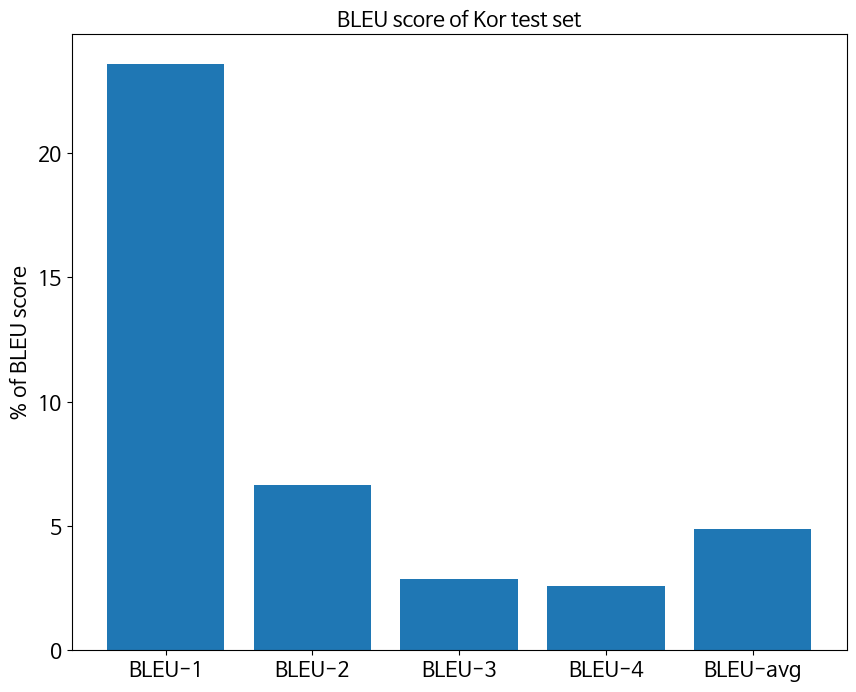

In [79]:
# BLEU visualizatoin

column = ['BLEU-1', 'BLEU-2', 'BLEU-3', 'BLEU-4', 'BLEU-avg']
values = [bleu_1, bleu_2, bleu_3, bleu_4, bleu_avg]
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111)
bar = plt.bar(column, values, align='center')
plt.title('BLEU score of Kor test set', fontsize = 15)
plt.ylabel('% of BLEU score', fontsize = 15)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

# 추가 Test

Prediction Caption: 넓은 <unk> 침대가 있는 방 <end>


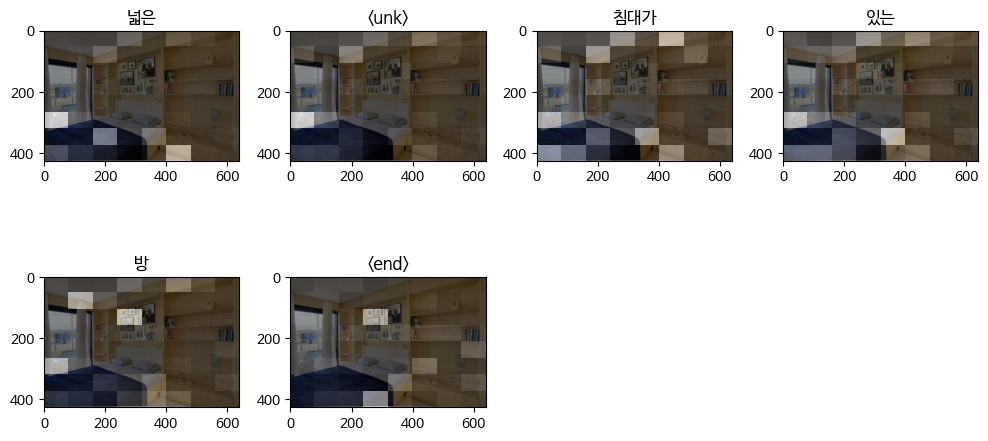

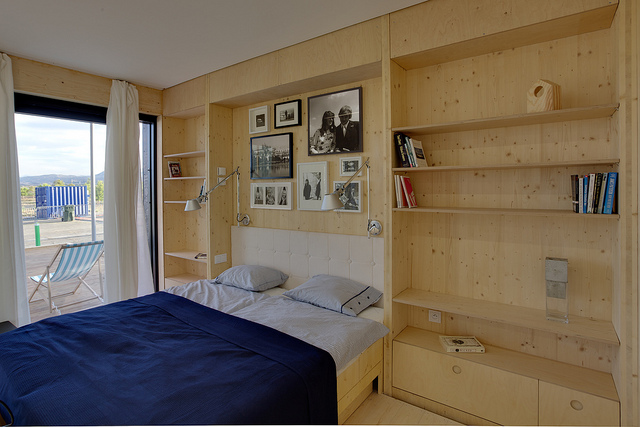

In [115]:
# image_url = 'https://i1.sndcdn.com/artworks-jK5rq85ivARYrQ7o-8ZlcRA-t500x500.jpg'
# image_extension = image_url[-4:]
# image_path = tf.keras.utils.get_file('image'+image_extension, origin=image_url)

# image_path = "/mnt/hdd/Korean_Based_Image_Captioning_Model/test_images/3.jpg"
image_path = "/mnt/hdd/Korean_Based_Image_Captioning_Model/val2014/COCO_val2014_000000577590.jpg"
result, attention_plot = evaluate(image_path)
print('Prediction Caption:', ' '.join(result))
plot_attention(image_path, result, attention_plot)
# opening the image
Image.open(image_path)